In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmFromTifs3"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmFromTifs3/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_CCB.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
30000


dict_keys(['Fish6_Untreated.mm', 'Fish6_ICE.mm', 'Fish6_CCB.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 32), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
30000 234 128
Epoch:  0 Iteration:  0 Loss:  640.914 2.8041 0.313545


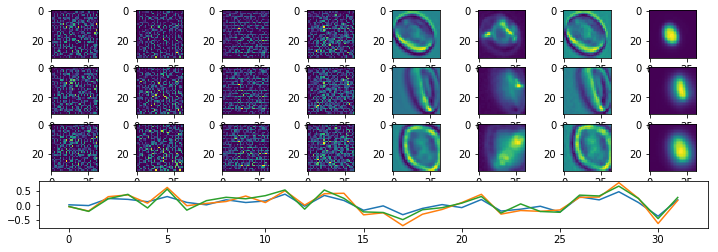

Epoch:  1 Iteration:  0 Loss:  18.7168 0.637969 0.00016889


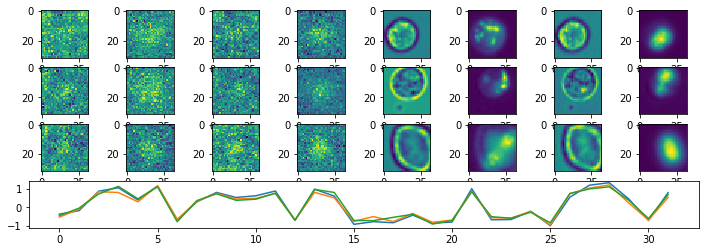

Epoch:  2 Iteration:  0 Loss:  15.8087 0.63639 0.00105596


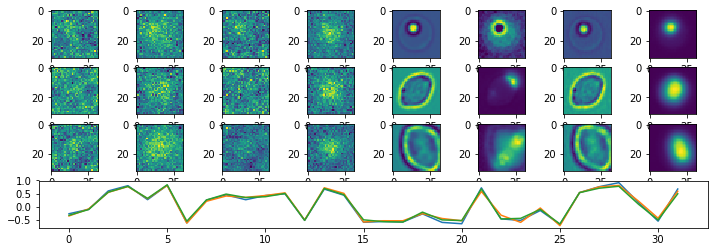

Epoch:  3 Iteration:  0 Loss:  14.8418 0.63591 0.0031524


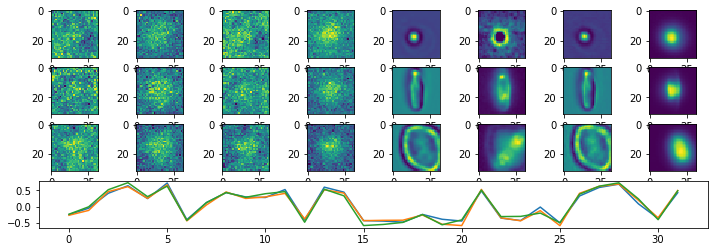

Epoch:  4 Iteration:  0 Loss:  13.1695 0.63501 0.00222629


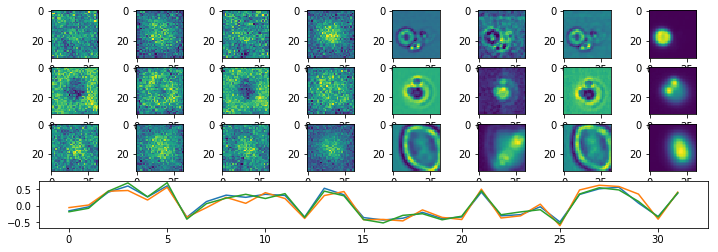

Epoch:  5 Iteration:  0 Loss:  12.7688 0.634821 0.00301614


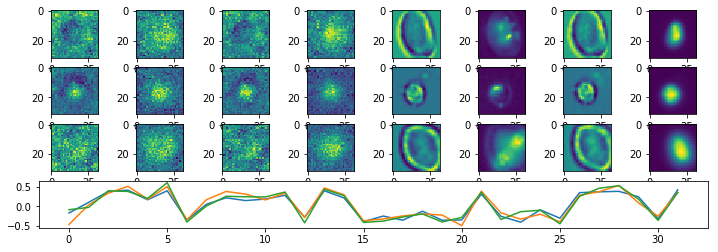

Epoch:  6 Iteration:  0 Loss:  11.4947 0.634146 0.00188386


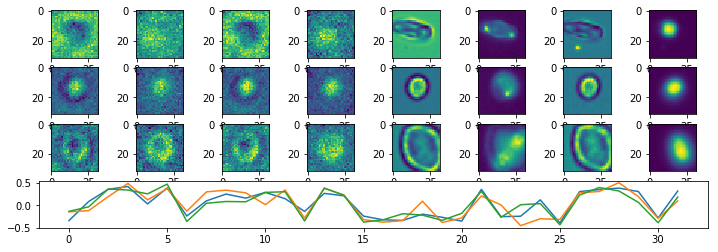

Epoch:  7 Iteration:  0 Loss:  10.7414 0.633773 0.002233


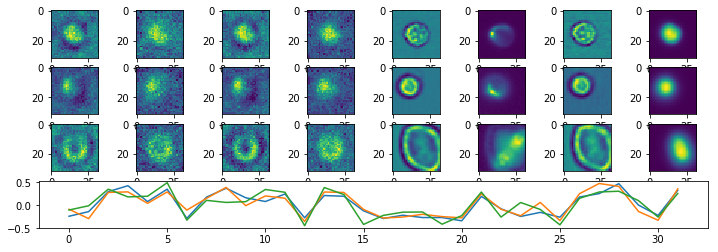

Epoch:  8 Iteration:  0 Loss:  10.0982 0.633432 0.00192332


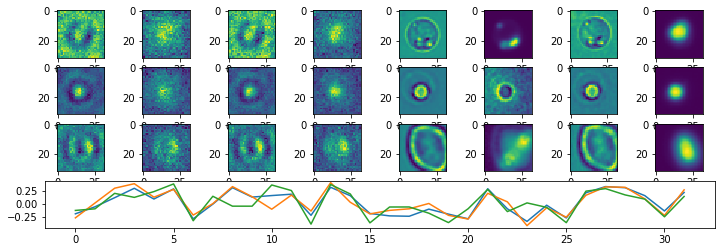

Epoch:  9 Iteration:  0 Loss:  9.77448 0.633257 0.00269499


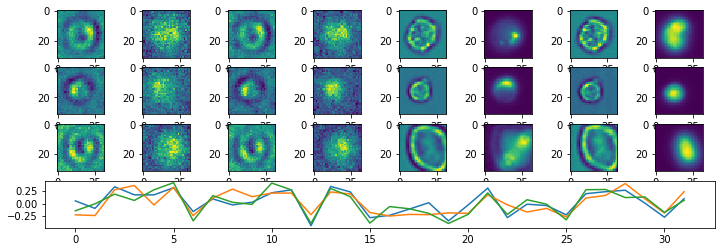

Epoch:  10 Iteration:  0 Loss:  8.95717 0.632826 0.00219002


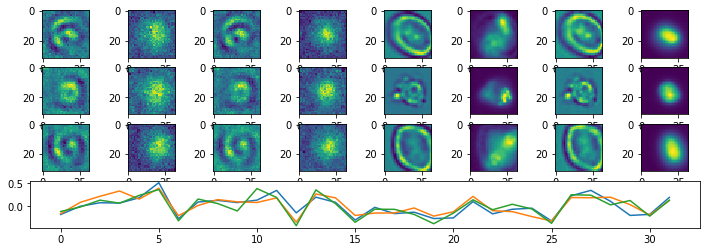

Epoch:  11 Iteration:  0 Loss:  8.48837 0.632583 0.00114873


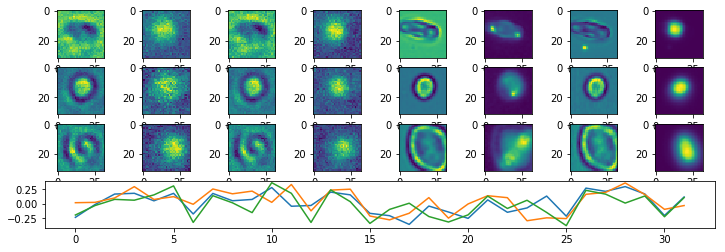

Epoch:  12 Iteration:  0 Loss:  8.20567 0.632435 0.00156647


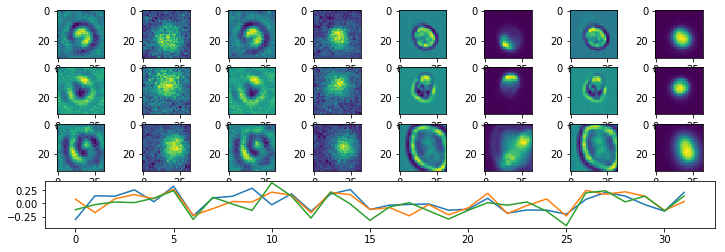

Epoch:  13 Iteration:  0 Loss:  7.93187 0.632292 0.00192034


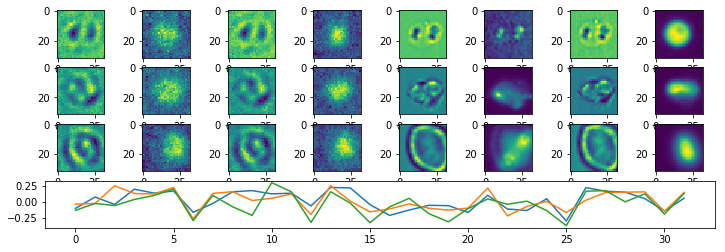

Epoch:  14 Iteration:  0 Loss:  7.6373 0.632137 0.00175923


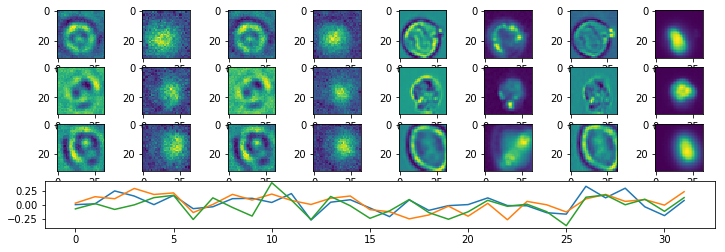

Epoch:  15 Iteration:  0 Loss:  7.45196 0.632041 0.00172177


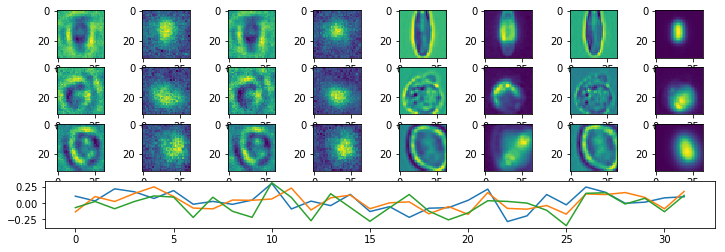

Epoch:  16 Iteration:  0 Loss:  7.33539 0.631981 0.00146067


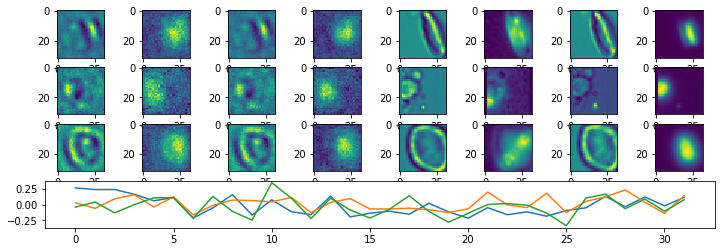

Epoch:  17 Iteration:  0 Loss:  7.15445 0.631888 0.00145817


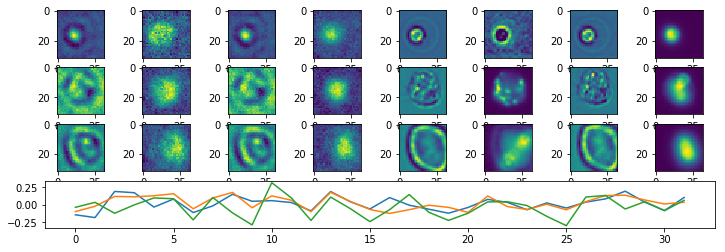

Epoch:  18 Iteration:  0 Loss:  7.02779 0.631821 0.00141987


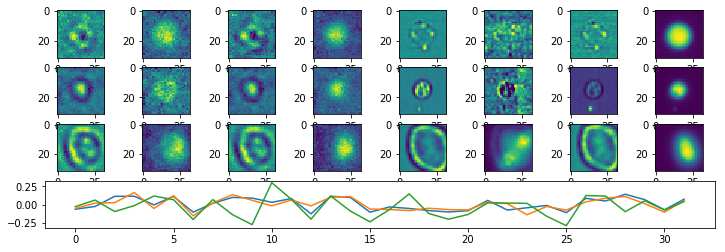

Epoch:  19 Iteration:  0 Loss:  6.94061 0.631774 0.00164172


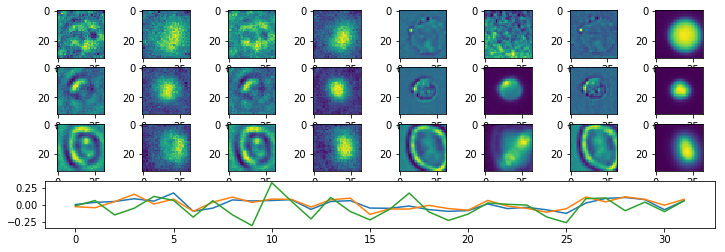

Epoch:  20 Iteration:  0 Loss:  7.01968 0.631813 0.0020535


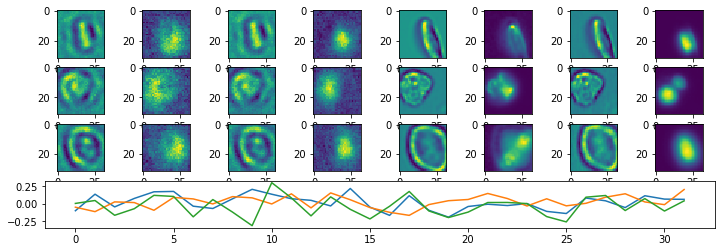

Epoch:  21 Iteration:  0 Loss:  6.84319 0.631723 0.0016776


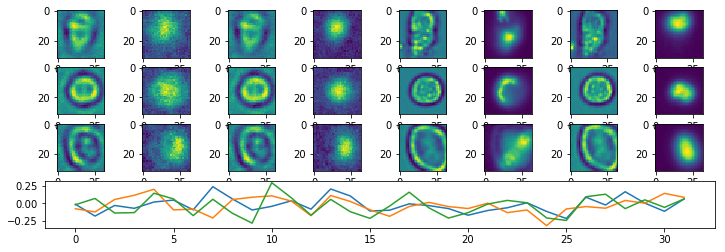

Epoch:  22 Iteration:  0 Loss:  6.64814 0.631621 0.00121659


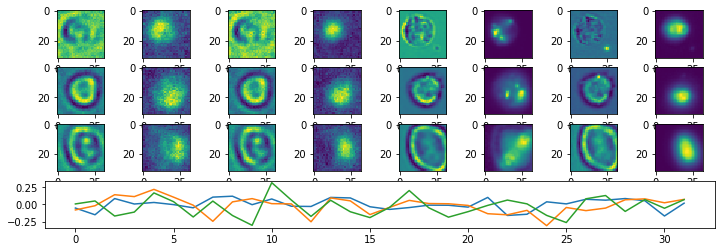

Epoch:  23 Iteration:  0 Loss:  6.62651 0.63161 0.001544


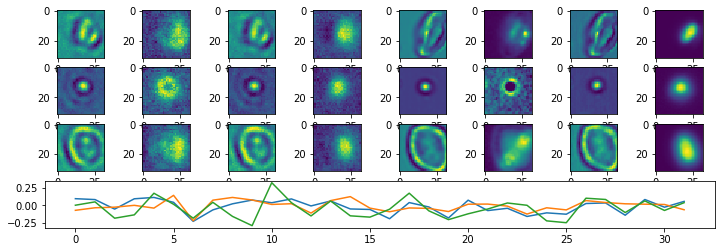

Epoch:  24 Iteration:  0 Loss:  6.54484 0.631568 0.00126329


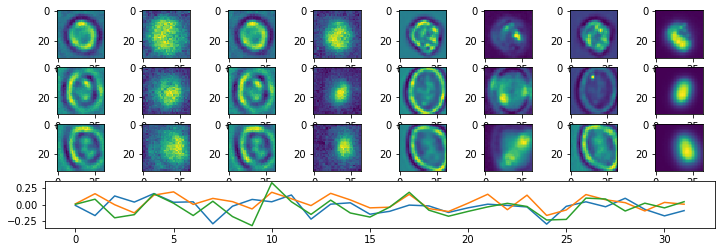

Epoch:  25 Iteration:  0 Loss:  6.42615 0.631506 0.0014106


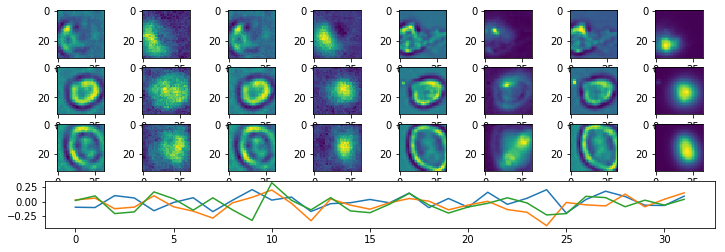

Epoch:  26 Iteration:  0 Loss:  6.34427 0.631465 0.00115839


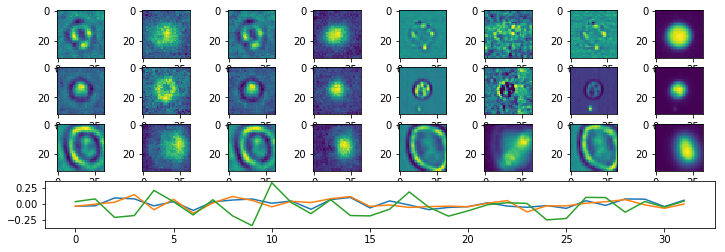

Epoch:  27 Iteration:  0 Loss:  6.30411 0.631443 0.00137937


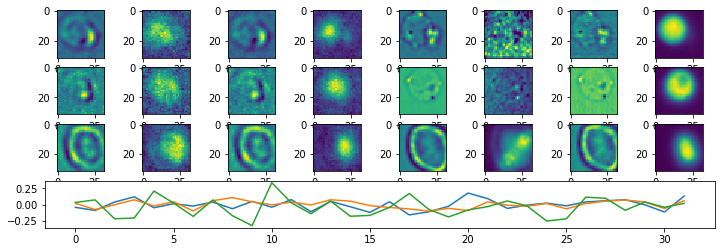

Epoch:  28 Iteration:  0 Loss:  6.2973 0.631438 0.00171542


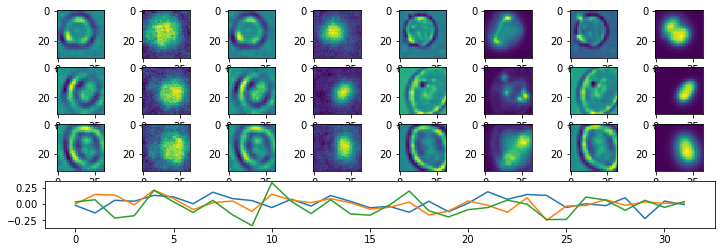

Epoch:  29 Iteration:  0 Loss:  6.1564 0.631366 0.00127867


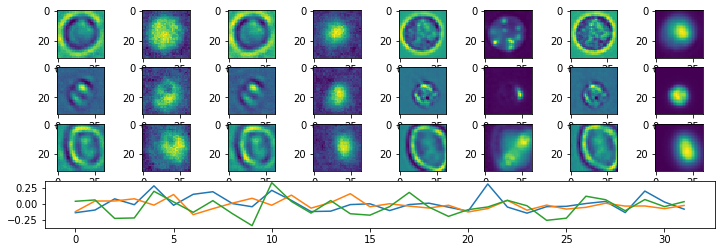

Epoch:  30 Iteration:  0 Loss:  6.14307 0.631359 0.00165313


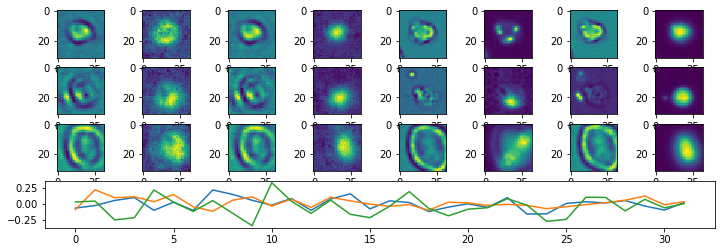

Epoch:  31 Iteration:  0 Loss:  6.04645 0.631309 0.00138822


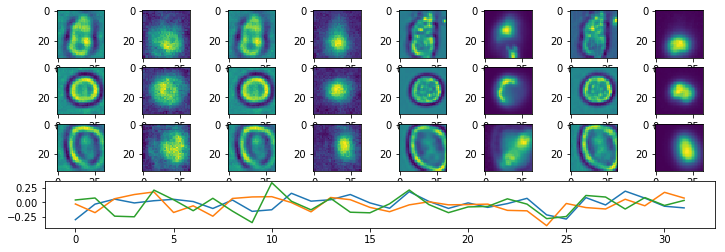

Epoch:  32 Iteration:  0 Loss:  5.98861 0.631279 0.00140578


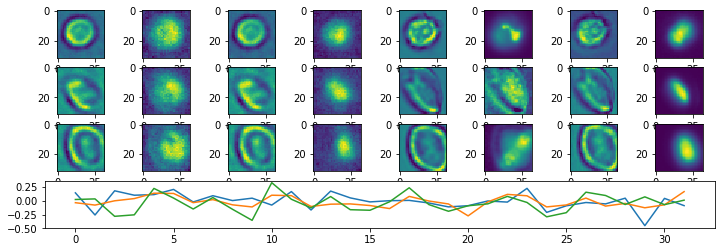

Epoch:  33 Iteration:  0 Loss:  5.95271 0.63126 0.00139129


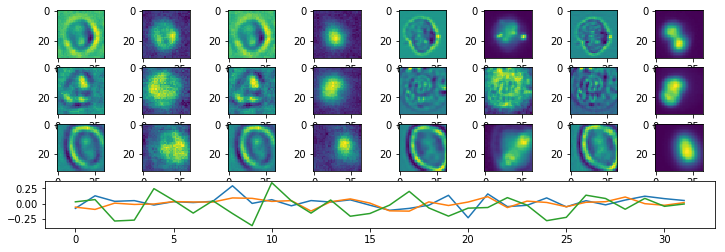

Epoch:  34 Iteration:  0 Loss:  5.84262 0.631203 0.00148812


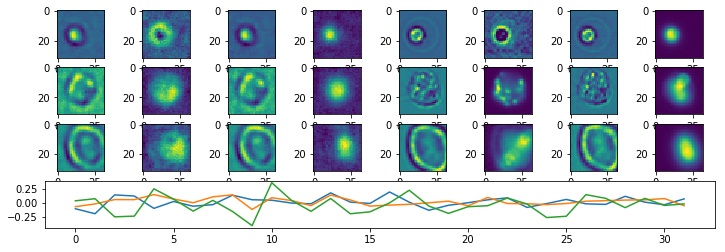

Epoch:  35 Iteration:  0 Loss:  5.79482 0.631177 0.00148487


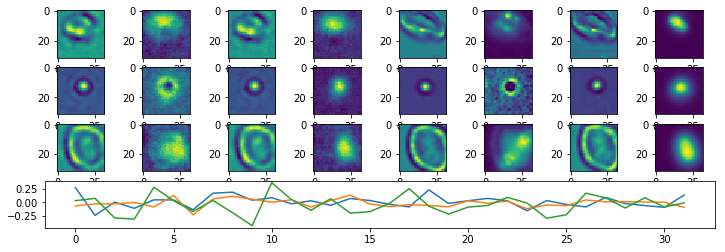

Epoch:  36 Iteration:  0 Loss:  5.74627 0.631151 0.00134635


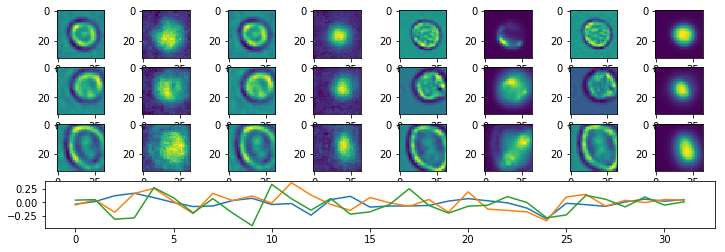

Epoch:  37 Iteration:  0 Loss:  5.73306 0.631144 0.00142178


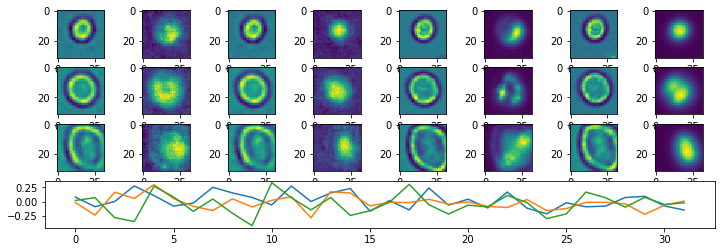

Epoch:  38 Iteration:  0 Loss:  5.63501 0.631093 0.0013791


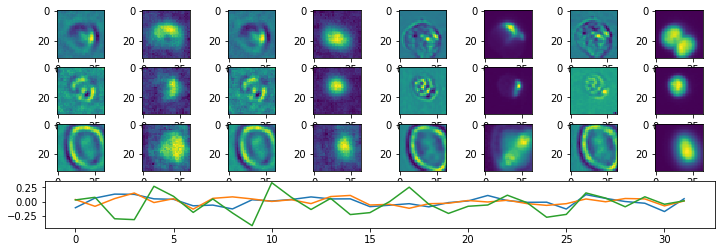

Epoch:  39 Iteration:  0 Loss:  5.65068 0.631101 0.00116301


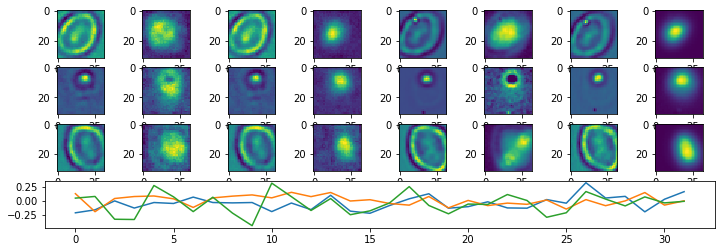

Epoch:  40 Iteration:  0 Loss:  5.64774 0.631097 0.00149283


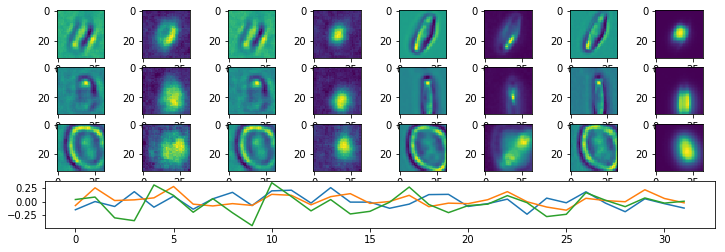

Epoch:  41 Iteration:  0 Loss:  5.53075 0.631038 0.00118089


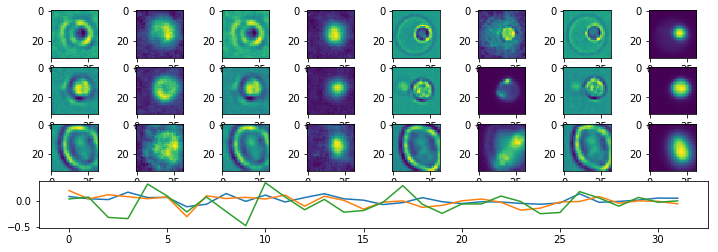

Epoch:  42 Iteration:  0 Loss:  5.55984 0.631052 0.00134495


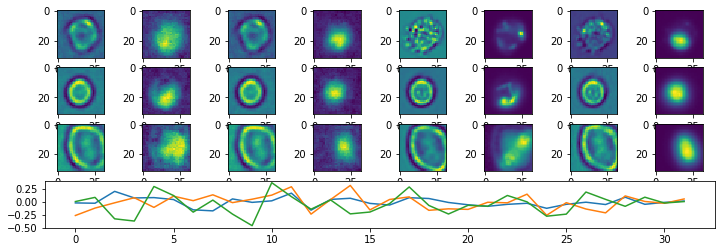

Epoch:  43 Iteration:  0 Loss:  5.41706 0.630979 0.00117603


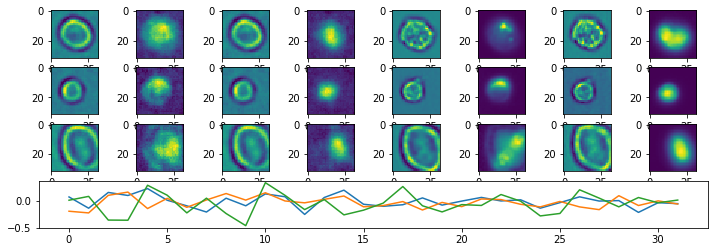

Epoch:  44 Iteration:  0 Loss:  5.43948 0.630989 0.00147656


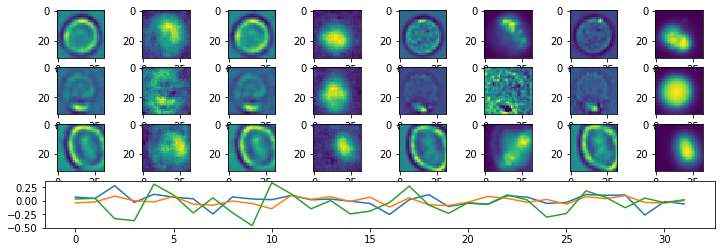

Epoch:  45 Iteration:  0 Loss:  5.3658 0.630952 0.00116849


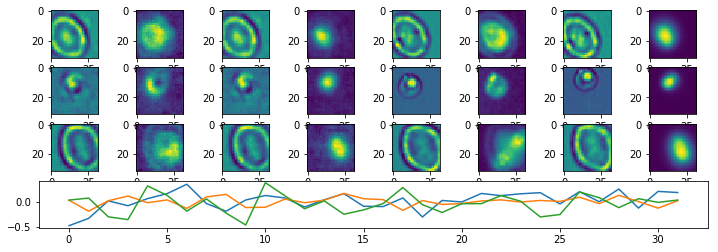

Epoch:  46 Iteration:  0 Loss:  5.33472 0.630936 0.00119996


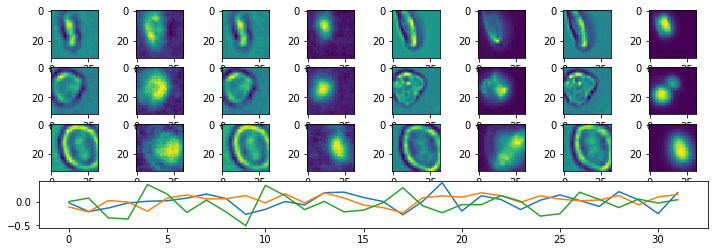

Epoch:  47 Iteration:  0 Loss:  5.33749 0.630938 0.000944644


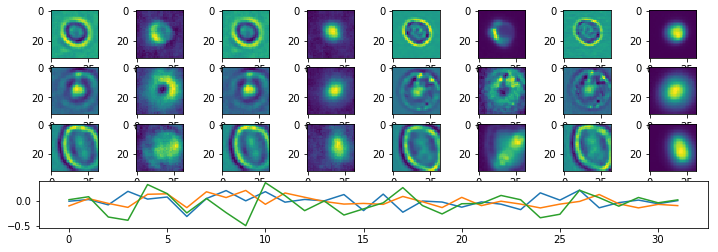

Epoch:  48 Iteration:  0 Loss:  5.26311 0.630899 0.000931859


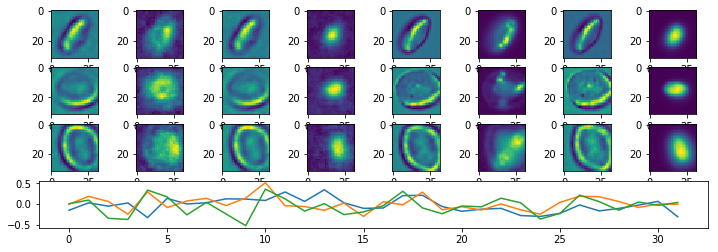

Epoch:  49 Iteration:  0 Loss:  5.25348 0.630893 0.00125921


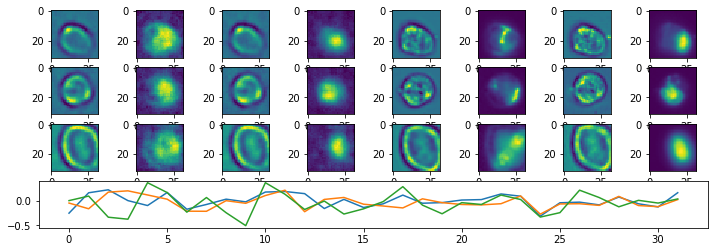

Epoch:  50 Iteration:  0 Loss:  5.25403 0.630894 0.00141644


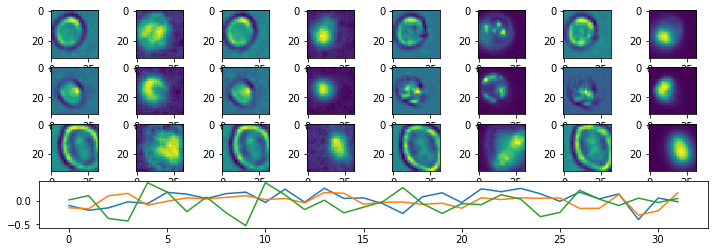

Epoch:  51 Iteration:  0 Loss:  5.20717 0.630869 0.00122482


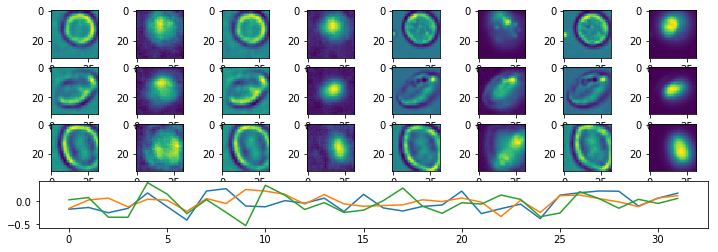

Epoch:  52 Iteration:  0 Loss:  5.12508 0.630827 0.00115371


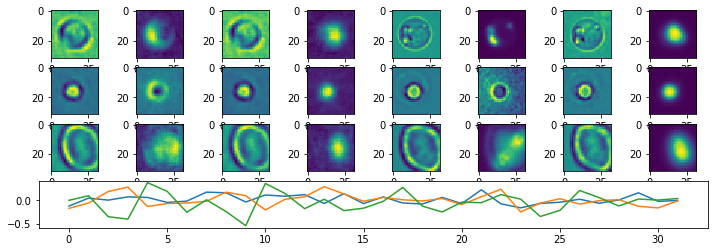

Epoch:  53 Iteration:  0 Loss:  5.12782 0.630828 0.00113159


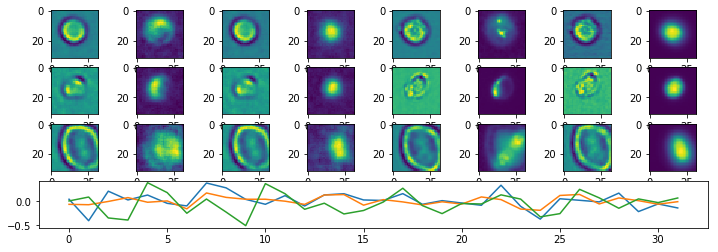

Epoch:  54 Iteration:  0 Loss:  5.09319 0.63081 0.00115904


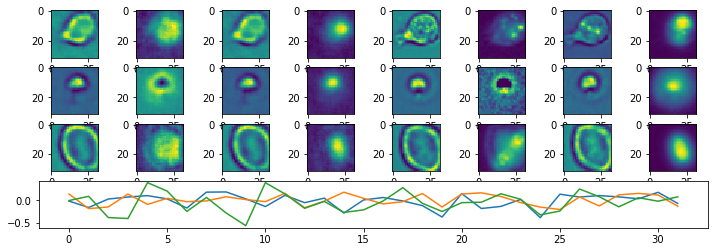

Epoch:  55 Iteration:  0 Loss:  5.13805 0.630835 0.00109571


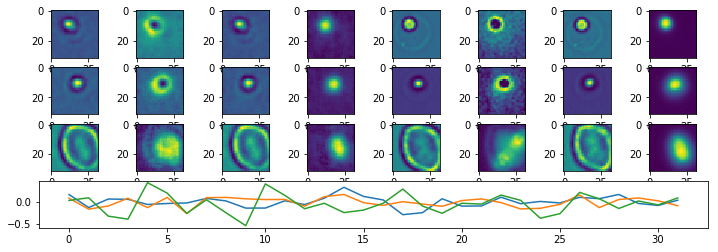

Epoch:  56 Iteration:  0 Loss:  5.11618 0.630822 0.00115535


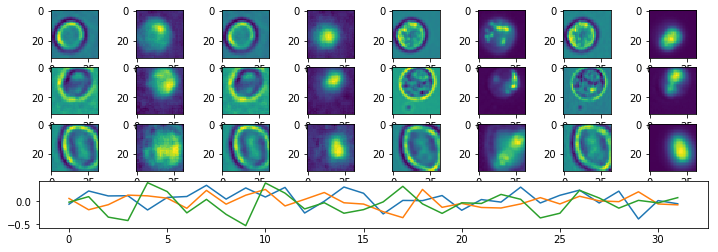

Epoch:  57 Iteration:  0 Loss:  5.01786 0.630772 0.00113818


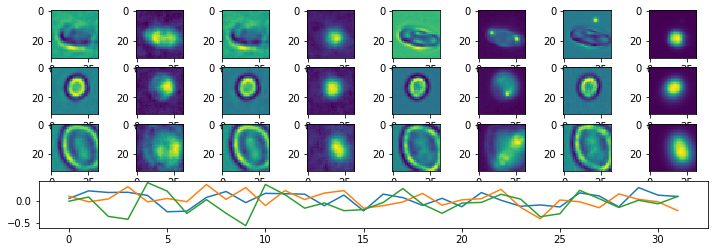

Epoch:  58 Iteration:  0 Loss:  5.04874 0.630787 0.00126758


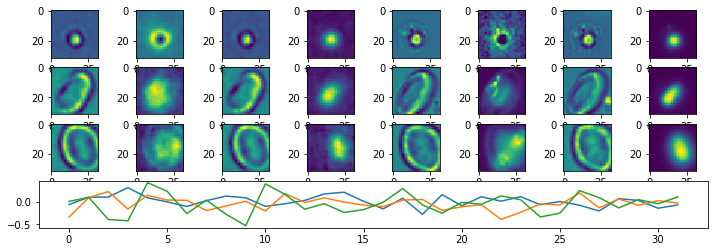

Epoch:  59 Iteration:  0 Loss:  5.07645 0.630801 0.000975698


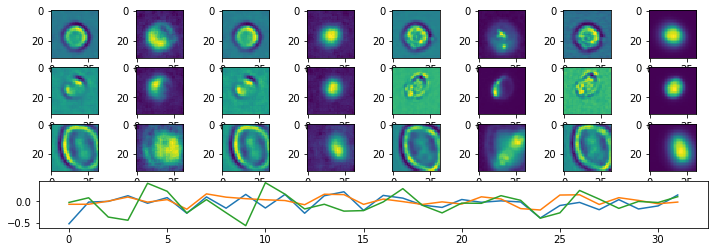

Epoch:  60 Iteration:  0 Loss:  4.99692 0.630761 0.000970125


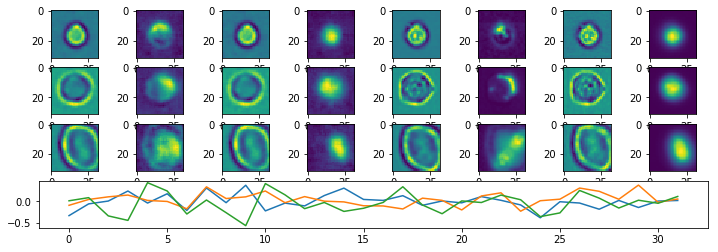

Epoch:  61 Iteration:  0 Loss:  4.92392 0.630724 0.000965685


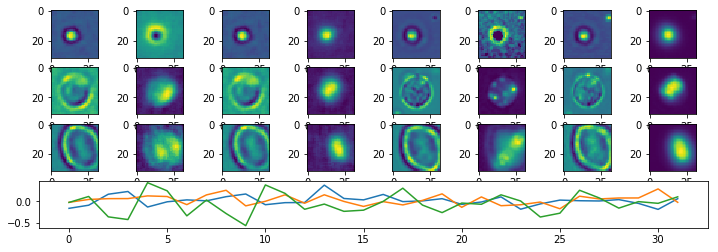

Epoch:  62 Iteration:  0 Loss:  4.95939 0.630742 0.00100642


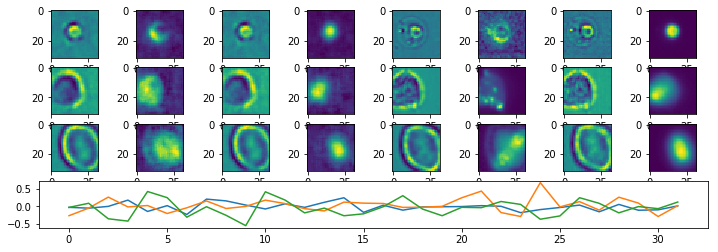

Epoch:  63 Iteration:  0 Loss:  4.91557 0.630718 0.000851721


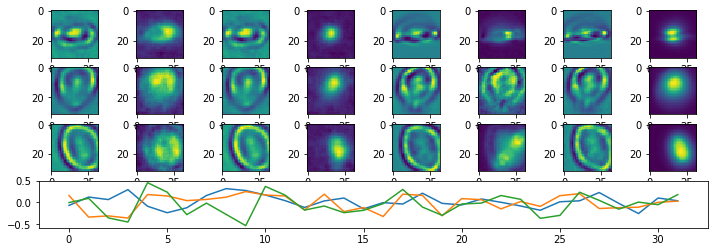

Epoch:  64 Iteration:  0 Loss:  4.95959 0.63074 0.00105679


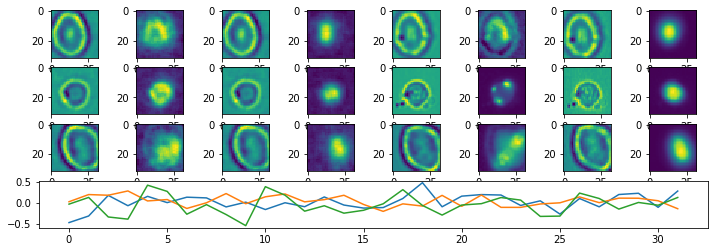

Epoch:  65 Iteration:  0 Loss:  4.89352 0.630707 0.00114018


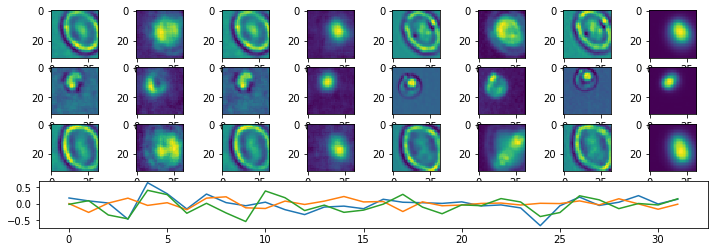

Epoch:  66 Iteration:  0 Loss:  4.90139 0.630711 0.00116053


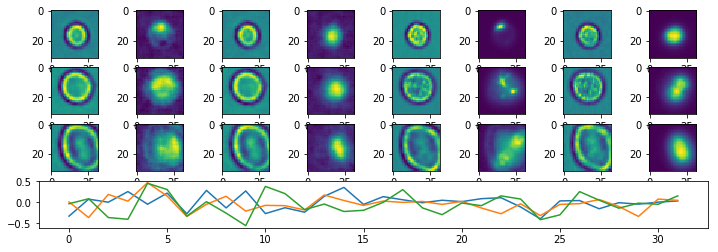

Epoch:  67 Iteration:  0 Loss:  4.88173 0.630704 0.000989795


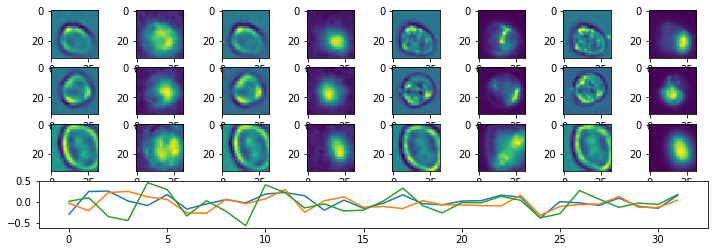

Epoch:  68 Iteration:  0 Loss:  4.84595 0.63068 0.00102392


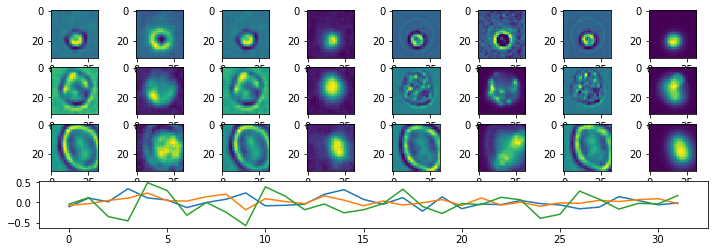

Epoch:  69 Iteration:  0 Loss:  4.79433 0.630655 0.00103164


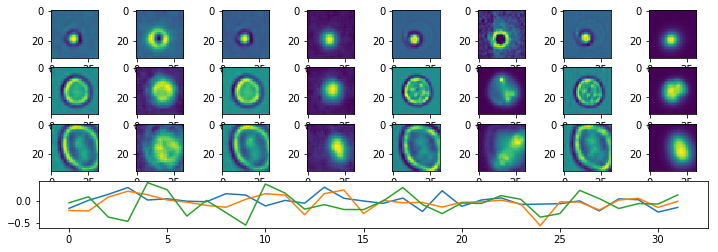

Epoch:  70 Iteration:  0 Loss:  4.80849 0.630663 0.000967354


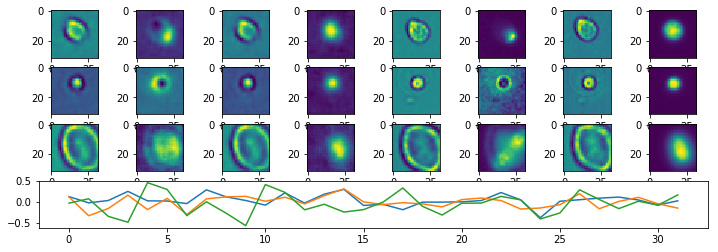

Epoch:  71 Iteration:  0 Loss:  4.77142 0.630645 0.000898987


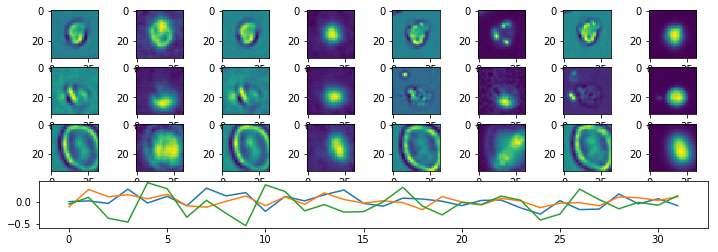

Epoch:  72 Iteration:  0 Loss:  4.74744 0.630631 0.00104812


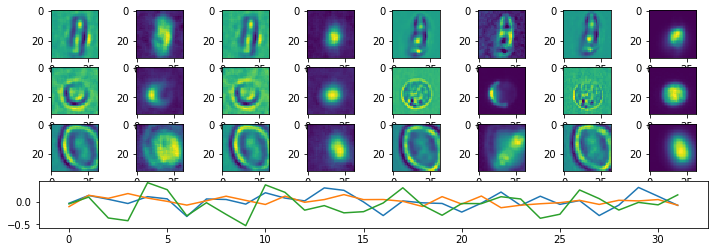

Epoch:  73 Iteration:  0 Loss:  4.80364 0.63066 0.00109637


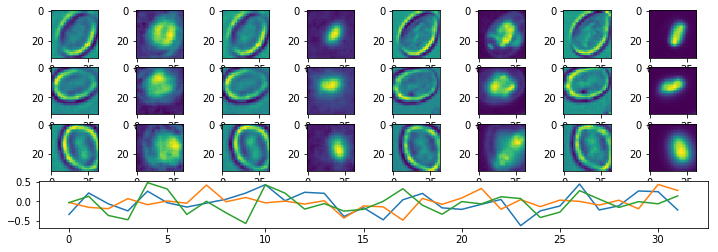

Epoch:  74 Iteration:  0 Loss:  4.8152 0.630665 0.00108308


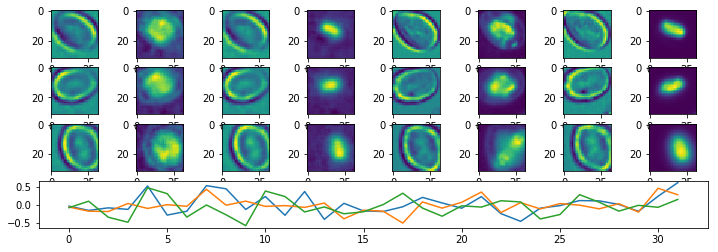

Epoch:  75 Iteration:  0 Loss:  4.77408 0.630645 0.000893384


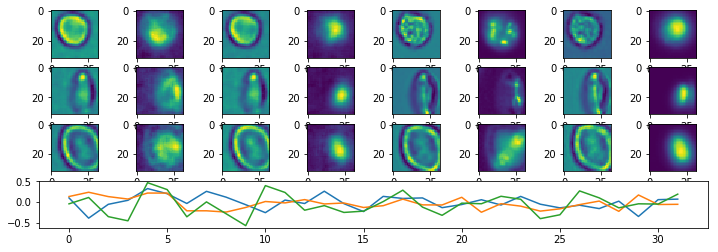

Epoch:  76 Iteration:  0 Loss:  4.75594 0.630636 0.0010587


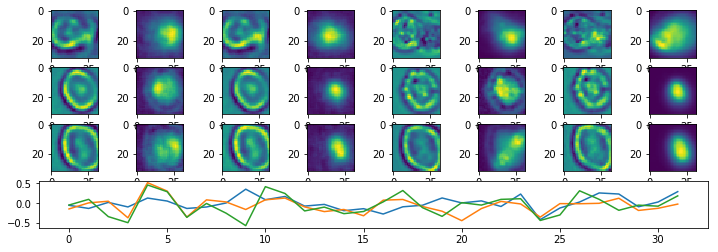

Epoch:  77 Iteration:  0 Loss:  4.73149 0.630623 0.00101942


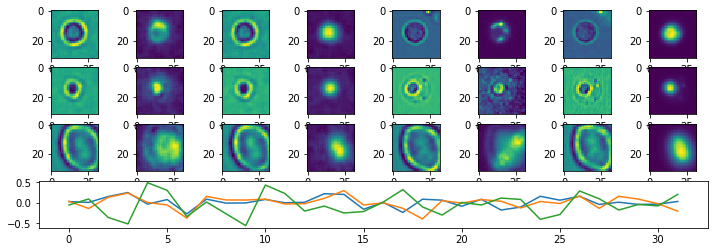

Epoch:  78 Iteration:  0 Loss:  4.77708 0.630646 0.00100702


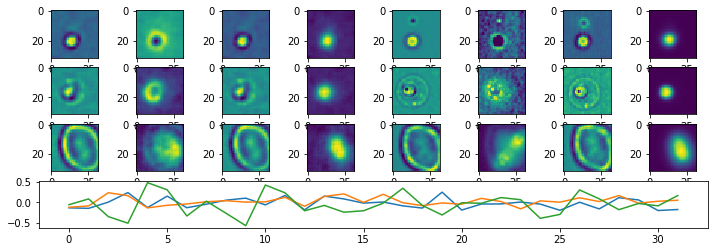

Epoch:  79 Iteration:  0 Loss:  4.68832 0.630601 0.000938296


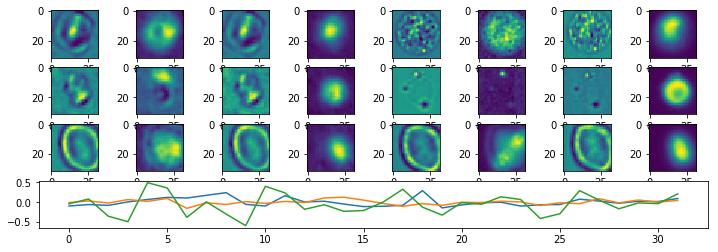

Epoch:  80 Iteration:  0 Loss:  4.70892 0.630612 0.000932187


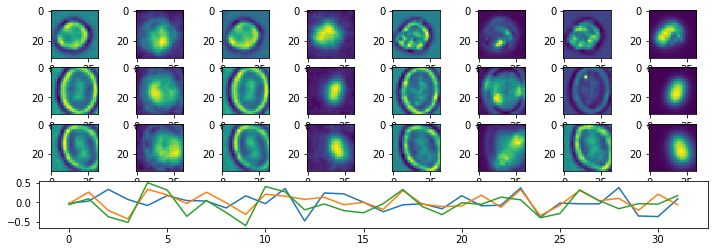

Epoch:  81 Iteration:  0 Loss:  4.66294 0.630588 0.000858128


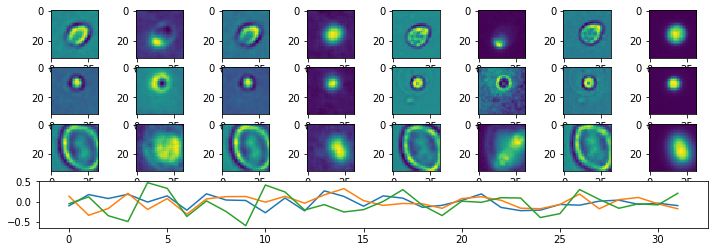

Epoch:  82 Iteration:  0 Loss:  4.71748 0.630616 0.000861347


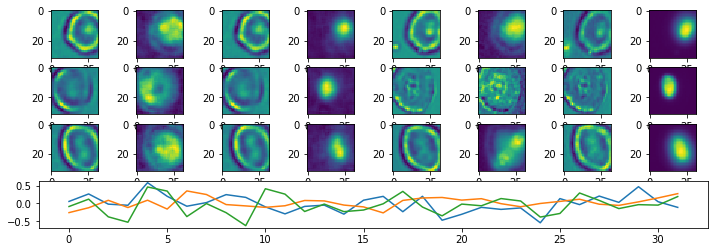

Epoch:  83 Iteration:  0 Loss:  4.6646 0.630589 0.00103021


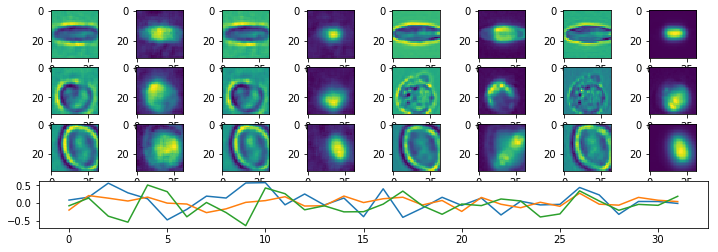

Epoch:  84 Iteration:  0 Loss:  4.7366 0.630624 0.00106633


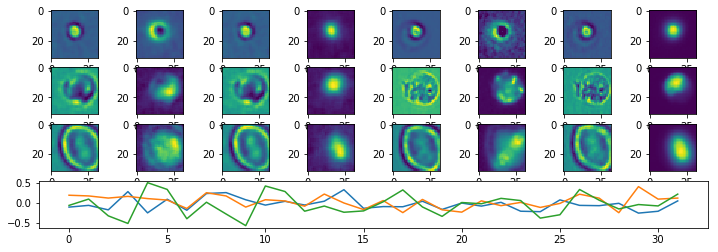

Epoch:  85 Iteration:  0 Loss:  4.66989 0.630591 0.00118241


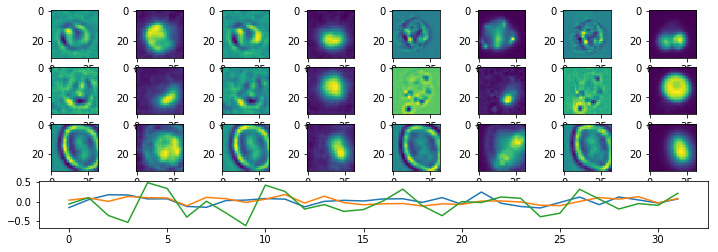

Epoch:  86 Iteration:  0 Loss:  4.68136 0.630596 0.00089404


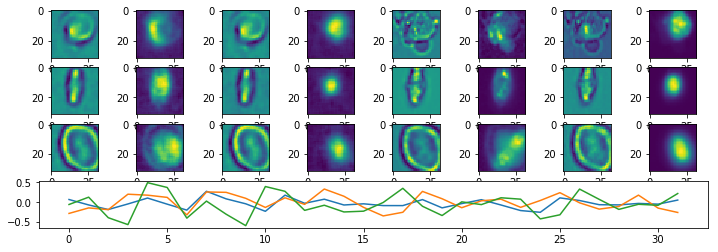

Epoch:  87 Iteration:  0 Loss:  4.63129 0.630571 0.0010044


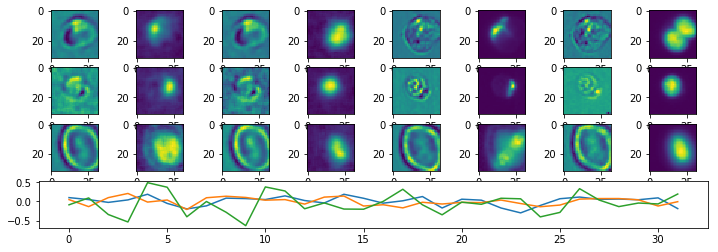

Epoch:  88 Iteration:  0 Loss:  4.64596 0.63058 0.000907362


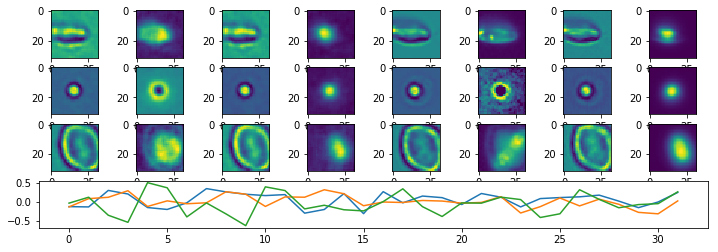

Epoch:  89 Iteration:  0 Loss:  4.62339 0.630566 0.0012897


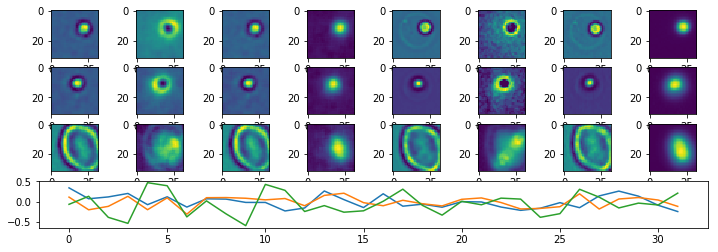

Epoch:  90 Iteration:  0 Loss:  4.58532 0.630548 0.000938088


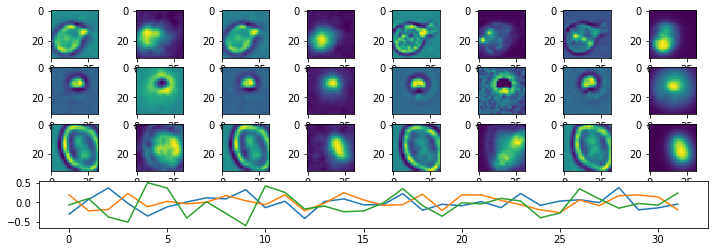

Epoch:  91 Iteration:  0 Loss:  4.61661 0.630564 0.000835836


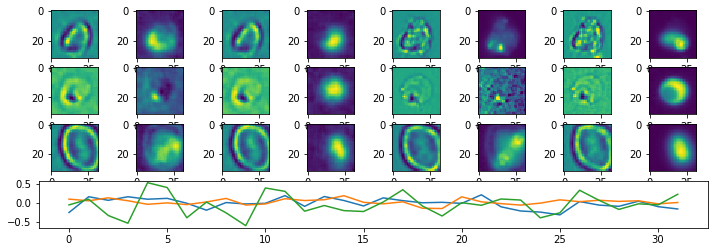

Epoch:  92 Iteration:  0 Loss:  4.60145 0.630556 0.000980914


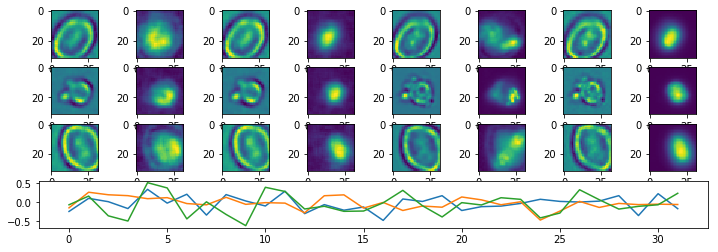

Epoch:  93 Iteration:  0 Loss:  4.6128 0.630562 0.000842452


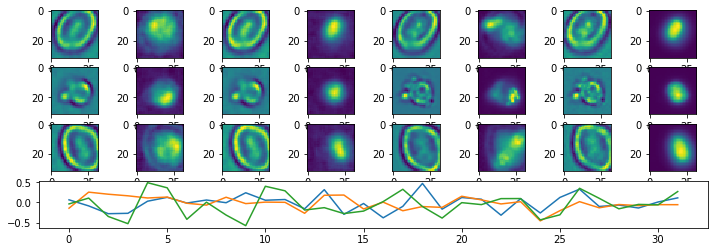

Epoch:  94 Iteration:  0 Loss:  4.58887 0.63055 0.000942945


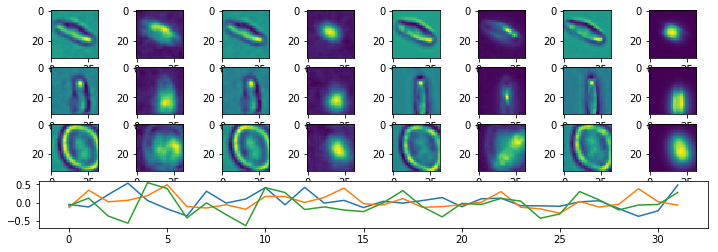

Epoch:  95 Iteration:  0 Loss:  4.62449 0.630567 0.000689149


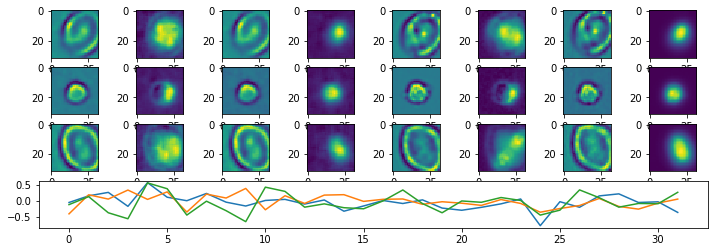

Epoch:  96 Iteration:  0 Loss:  4.62189 0.630566 0.000832349


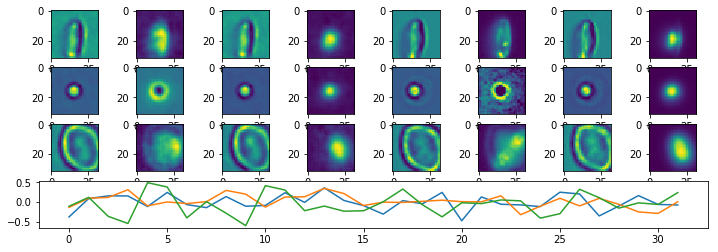

Epoch:  97 Iteration:  0 Loss:  4.60378 0.630556 0.000931114


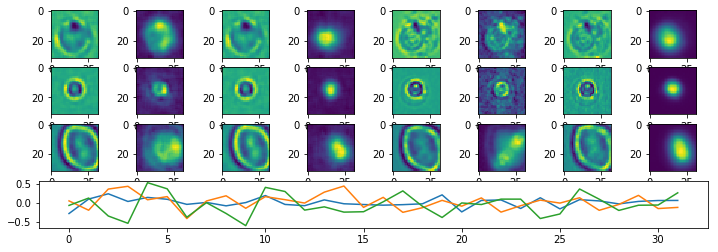

Epoch:  98 Iteration:  0 Loss:  4.55974 0.630533 0.000852257


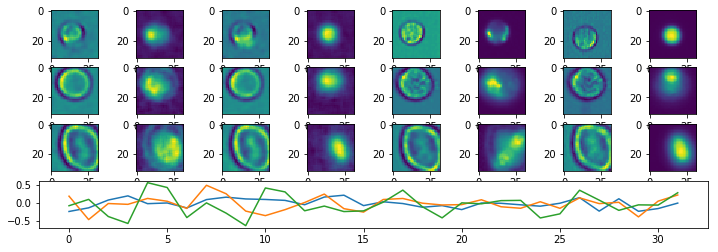

Epoch:  99 Iteration:  0 Loss:  4.57611 0.630542 0.00104988


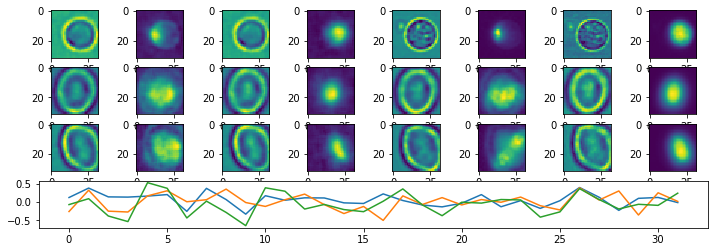

Epoch:  100 Iteration:  0 Loss:  4.52884 0.630519 0.00094533


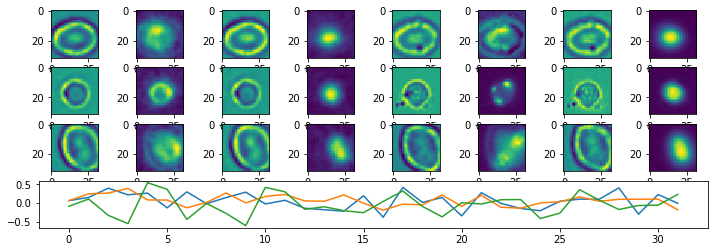

Epoch:  101 Iteration:  0 Loss:  4.52216 0.630514 0.000993401


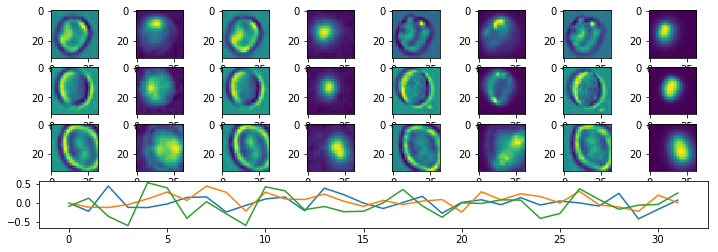

Epoch:  102 Iteration:  0 Loss:  4.55373 0.630531 0.00091204


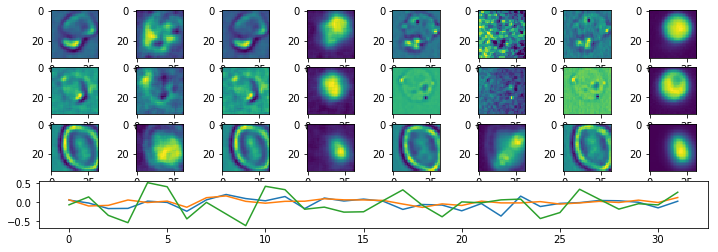

Epoch:  103 Iteration:  0 Loss:  4.55067 0.63053 0.000789404


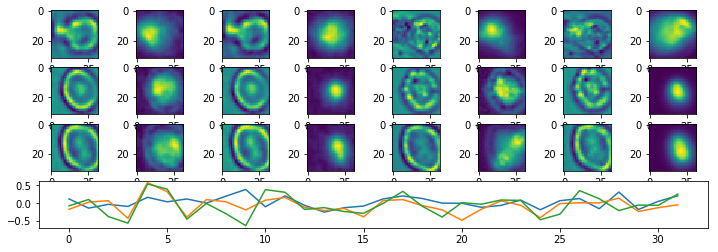

Epoch:  104 Iteration:  0 Loss:  4.53961 0.630524 0.00109157


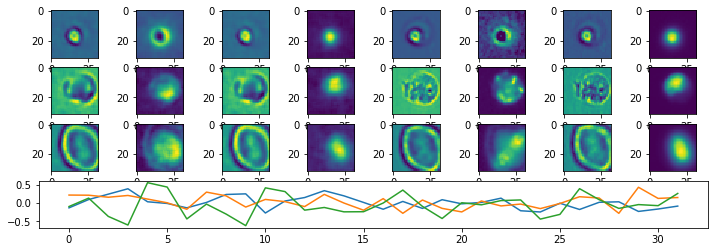

Epoch:  105 Iteration:  0 Loss:  4.49857 0.630503 0.000840098


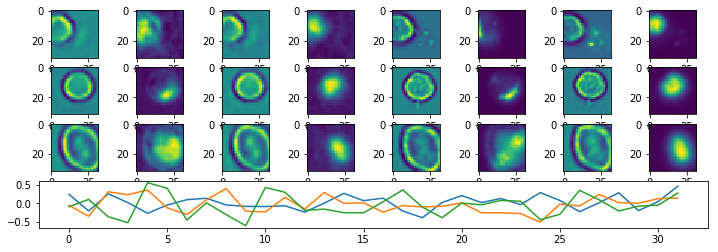

Epoch:  106 Iteration:  0 Loss:  4.52764 0.630518 0.000938505


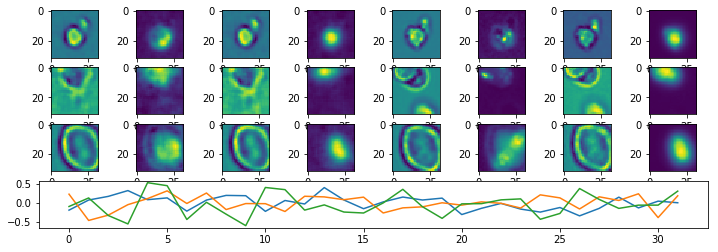

Epoch:  107 Iteration:  0 Loss:  4.51535 0.630512 0.000899374


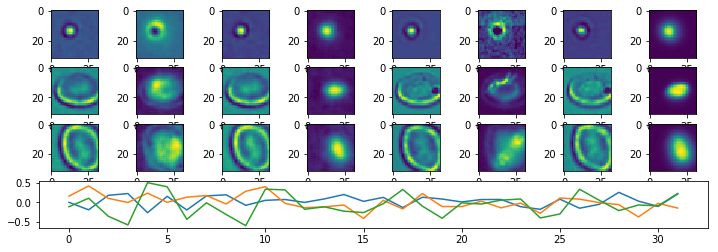

Epoch:  108 Iteration:  0 Loss:  4.52944 0.63052 0.000943959


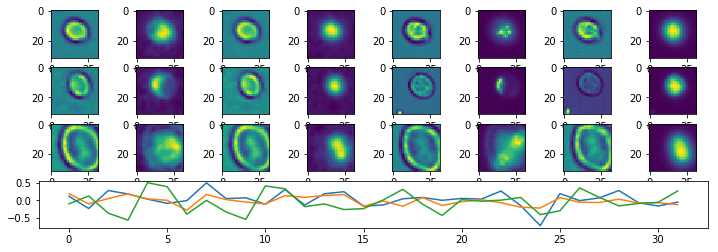

Epoch:  109 Iteration:  0 Loss:  4.53167 0.630519 0.000906438


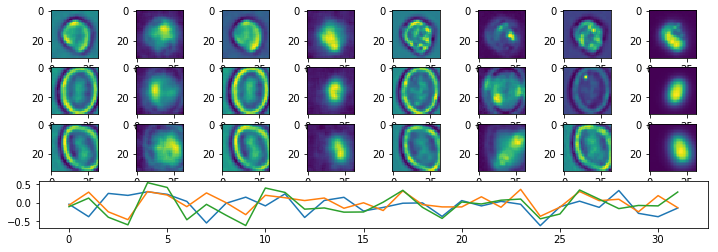

Epoch:  110 Iteration:  0 Loss:  4.51223 0.630509 0.000996351


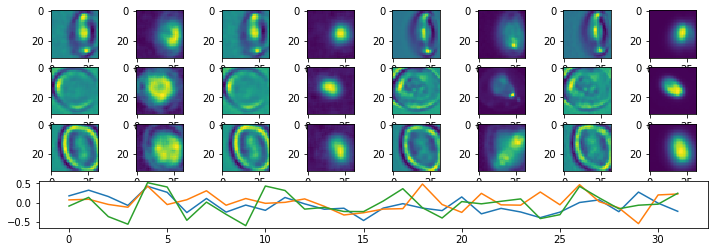

Epoch:  111 Iteration:  0 Loss:  4.49011 0.630499 0.000828356


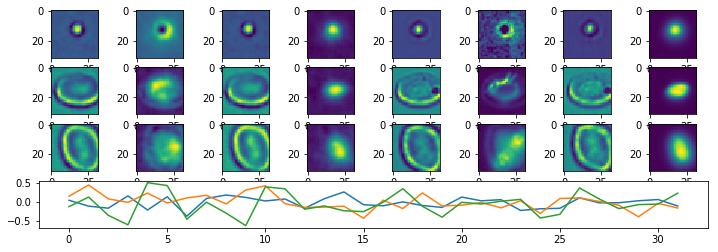

Epoch:  112 Iteration:  0 Loss:  4.48053 0.630493 0.000735909


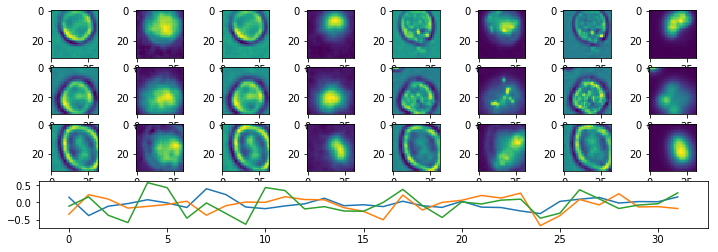

Epoch:  113 Iteration:  0 Loss:  4.50613 0.630507 0.000758052


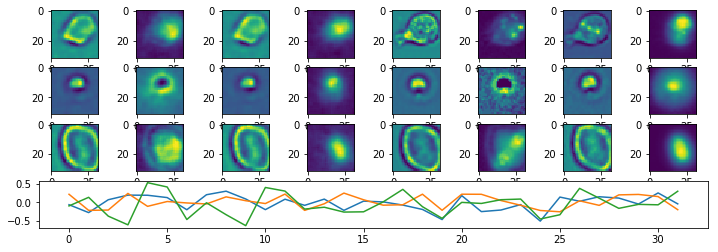

Epoch:  114 Iteration:  0 Loss:  4.44994 0.630477 0.000843465


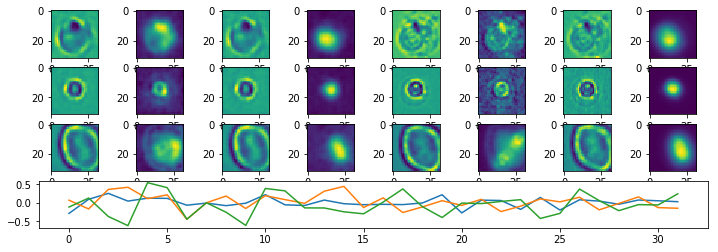

Epoch:  115 Iteration:  0 Loss:  4.40418 0.630454 0.00103587


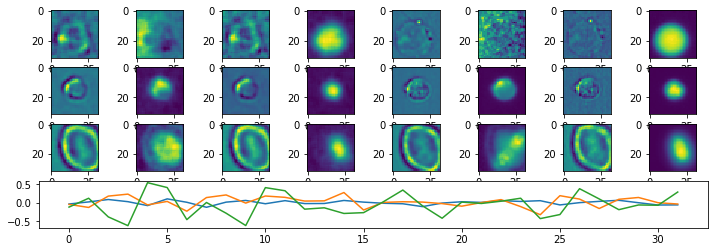

Epoch:  116 Iteration:  0 Loss:  4.47604 0.630491 0.00100943


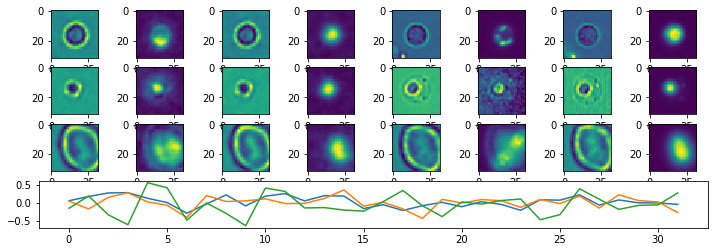

Epoch:  117 Iteration:  0 Loss:  4.46305 0.630485 0.000963241


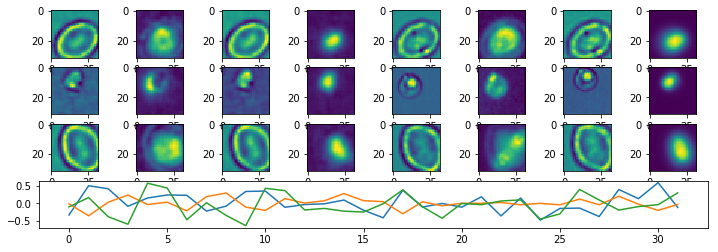

Epoch:  118 Iteration:  0 Loss:  4.47882 0.630491 0.000840396


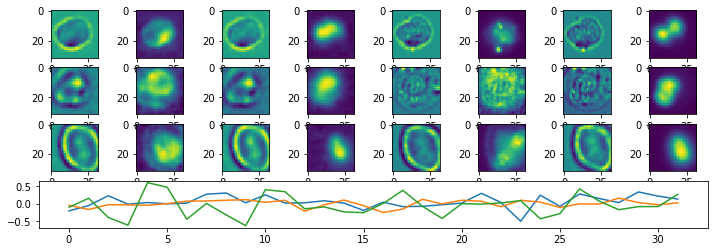

Epoch:  119 Iteration:  0 Loss:  4.40734 0.630457 0.000846028


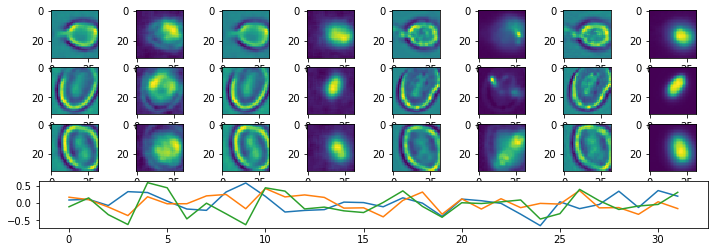

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 120
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 32 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-04-24-LS32"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4